In [1]:
import os
import sys
import numpy as np
import matplotlib.pyplot as plt
#from utils import *

In [2]:
volume_constant = (10**-2)*( (200/2048) * (3.086/0.7))**3

#dens_path = '/storage/filament/data/box01/256den18a+1024+1'
#temp_path = '/storage/filament/data/box01/256den18f+1024+1'
xray_path = '/storage/filament/data/box01/256den18g+1024+1'

#dens = np.genfromtxt(dens_path,dtype='float64')
#temp = np.genfromtxt(temp_path,dtype='float64')
xray = np.genfromtxt(xray_path,dtype='float64')*volume_constant

In [3]:
nx = 256 
xray_re = xray.reshape([nx,nx,nx])
#temp_re = temp.reshape([nx,nx,nx])

candidate_x = []
candidate_y = []
candidate_z = []

for iz in range(nx):
    for iy in range(nx):
        for ix in range(nx):
            if xray_re[ix,iy,iz] >= 10**-5.5:
                candidate_x.append(ix)
                candidate_y.append(iy)
                candidate_z.append(iz)

In [ ]:
candidate_coords = np.array(list(zip(candidate_x,candidate_y,candidate_z)))
#candidate_coords = sorted(candidate_coords, key = lambda x:x[2])

In [18]:
candidate_coords[candidate_coords<0]

array([], dtype=int64)

In [39]:
coords = local_maximum_3d(candidate_coords,xray_re,14)

In [31]:
coords[coords<0]

array([], dtype=int64)

In [37]:
def local_maximum_3d(candidate_coords,array,local_box_size):

    local_box_size = 14
    num_candidate = len(candidate_coords)

    candidate_x_v2 = []
    candidate_y_v2 exit
    ex= []
    candidate_z_v2 = []


    for nn,(nx,ny,nz) in enumerate(candidate_coords):


        if(nx-int(local_box_size/2) >= 0 and ny-int(local_box_size) >= 0 and nz-int(local_box_size) >= 0  and \
            nx+int(local_box_size)+1 <=255 and ny+int(local_box_size)+1 <=255 and nz+int(local_box_size)+1 <=255 ):
            starting_value = array[nx,ny,nz]
            tmp_x = nx
            tmp_y = ny
            tmp_z = nz

            for iz in range(local_box_size):
                for iy in range(local_box_size):
                    for ix in range(local_box_size):

                        compare_value = array[nx-int(local_box_size/2)+ix+1,ny-int(local_box_size/2)+iy+1,nz-int(local_box_size/2)+iz+1]

                        if starting_value < compare_value:
                            tmp_x = nx-int(local_box_size/2)+ix+1
                            tmp_y = ny-int(local_box_size/2)+iy+1
                            tmp_z = nz-int(local_box_size/2)+iz+1

                            starting_value = compare_value 
                        else:
                            pass
        else:
            continue
                            
        
        
        candidate_x_v2.append(tmp_x)
        candidate_y_v2.append(tmp_y)
        candidate_z_v2.append(tmp_z)
 

    coords = set(list(zip(candidate_x_v2,candidate_y_v2,candidate_z_v2)))
    coords = np.array(sorted(coords, key = lambda x:x[2]))

        
    return coords


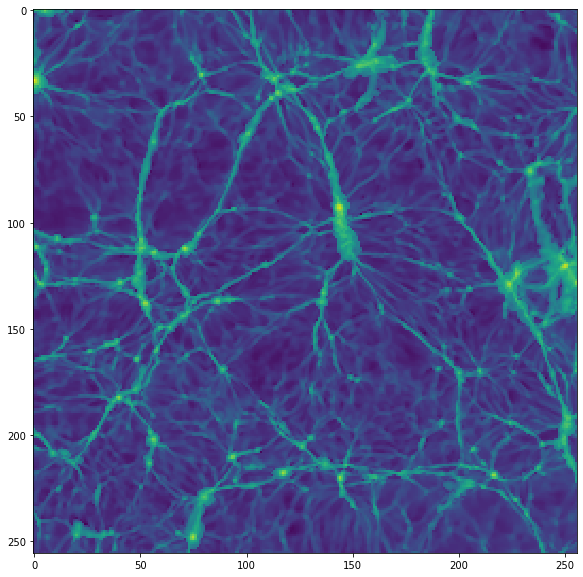

In [16]:
plt.figure(figsize=[10,10])
plt.imshow(np.log10(xray_re[:,:,24]))
#plt.scatter(test_coords[:,1],test_coords[:,0],c='red')

In [32]:
os.chdir('/storage/cluster/result/')
np.savetxt('coords.txt',coords,fmt='%3i')

/home/ha/anaconda3/envs/cluster/lib/python3.6/site-packages/ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


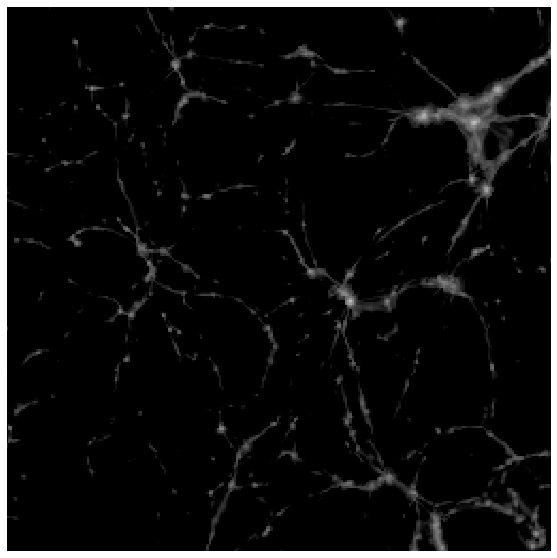

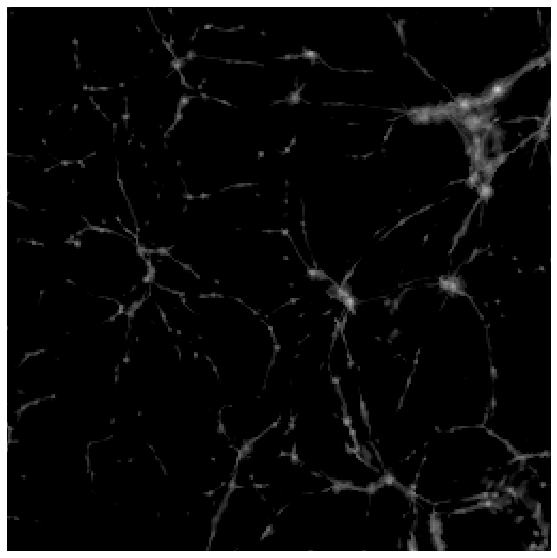

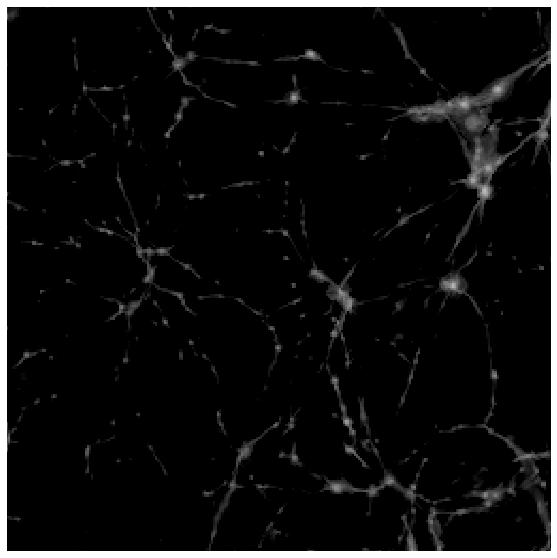

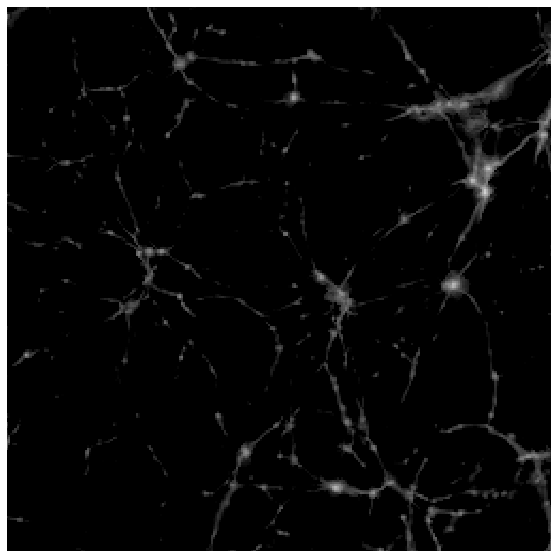

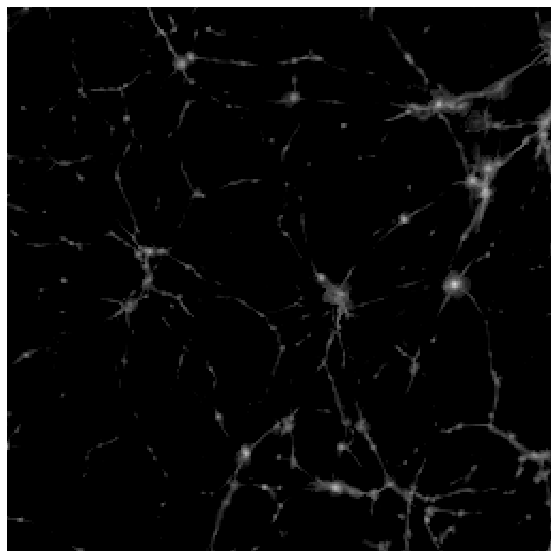

...

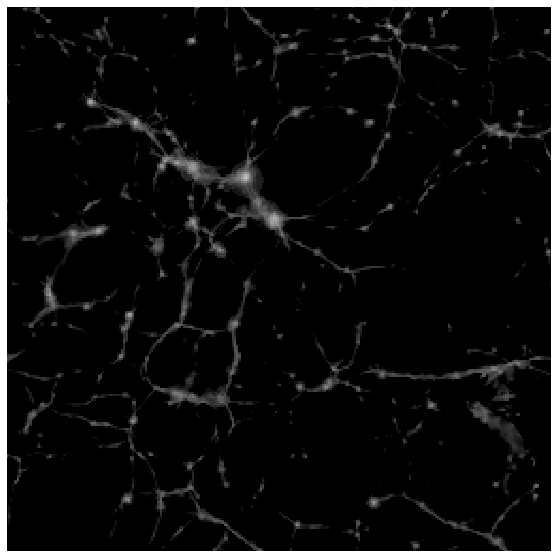

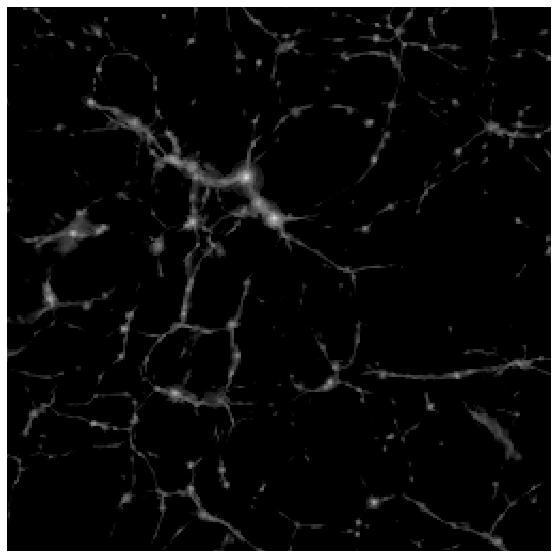

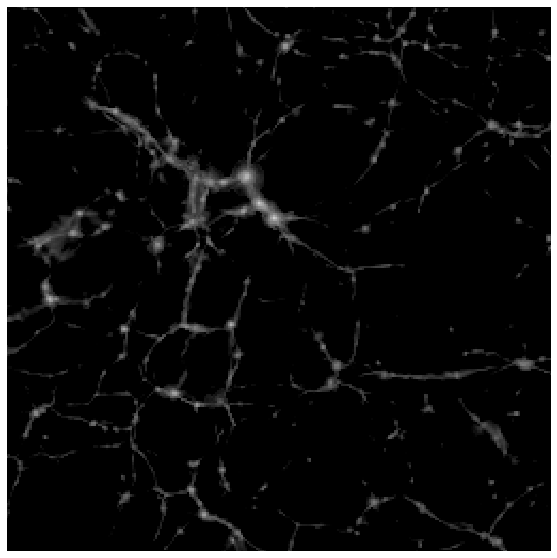

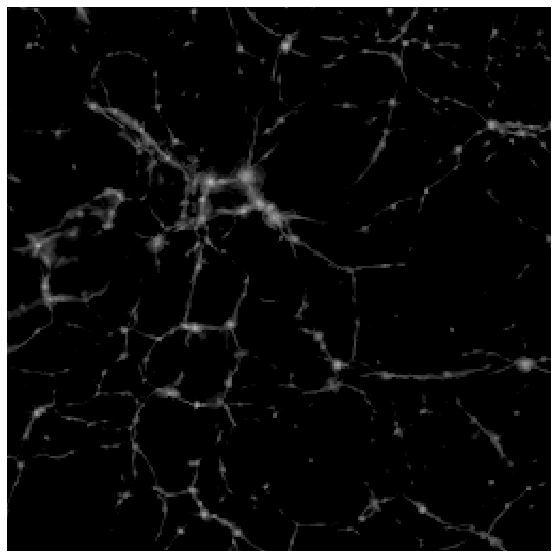

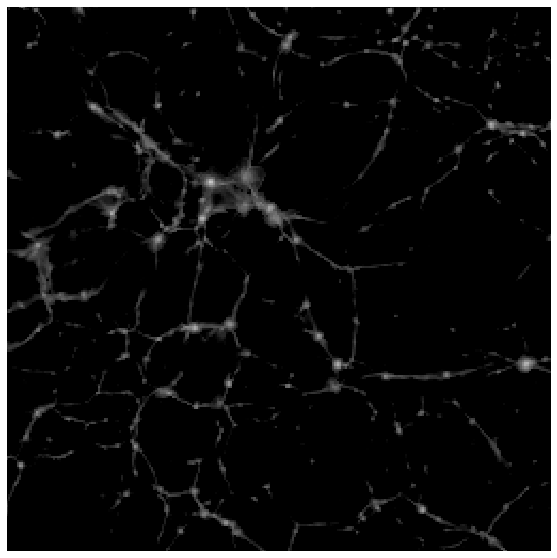

In [40]:
os.chdir('/storage/cluster/result/test1/')

for i in range(256):
    

    plt.figure(figsize=[10,10])
    try:
        min_coords = np.min(np.where(coords[:,2]==i))
        max_coords = np.max(np.where(coords[:,2]==i))
        plt.scatter(coords[min_coords:max_coords+1,1],coords[min_coords:max_coords+1,0],c='red')
    except:
        pass
    plt.imshow(np.log10(xray_re[:,:,i]),vmin=-12,vmax=-1,cmap='gray')
    plt.xlim([0,255])
    plt.ylim([0,255])
    plt.axis('off')
    plt.savefig(str(i) + '.png',dpi=100,format='png',bbox_inches='tight',pad_inches=0)

    
        #plt.imshow(np.log10(xray_re[:,:,i]),vmin=-14,vmax=-5,cmap='gray')

KeyboardInterrupt: 

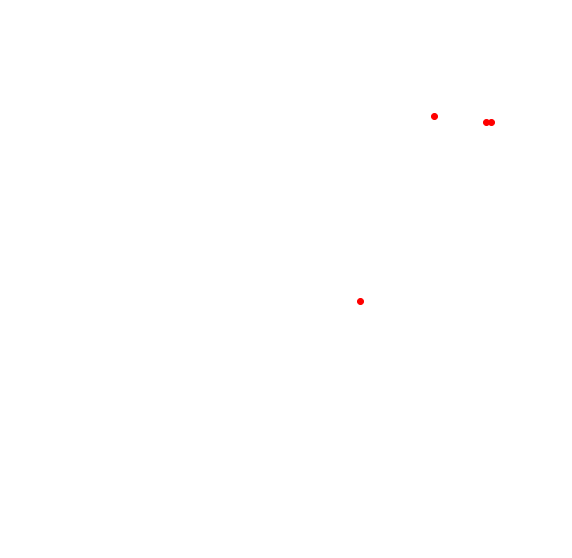

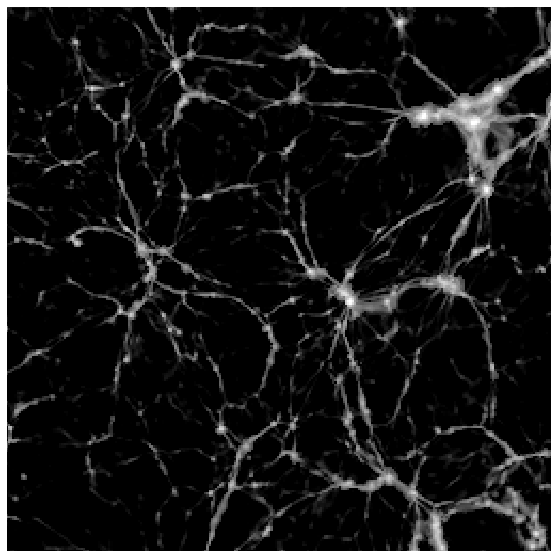

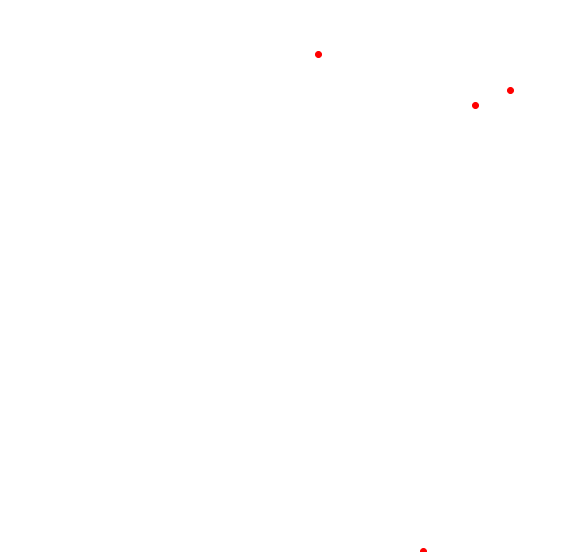

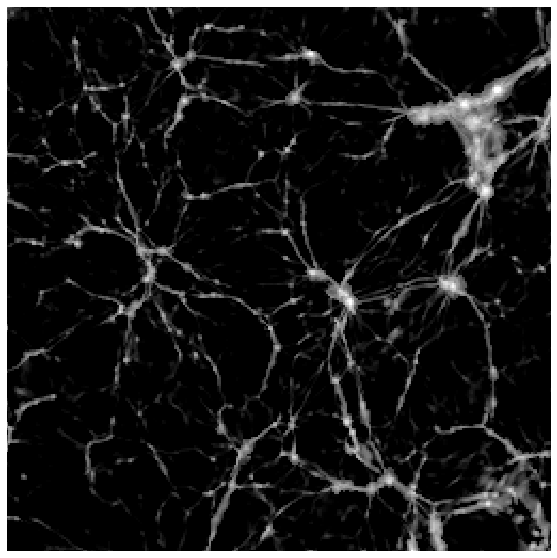

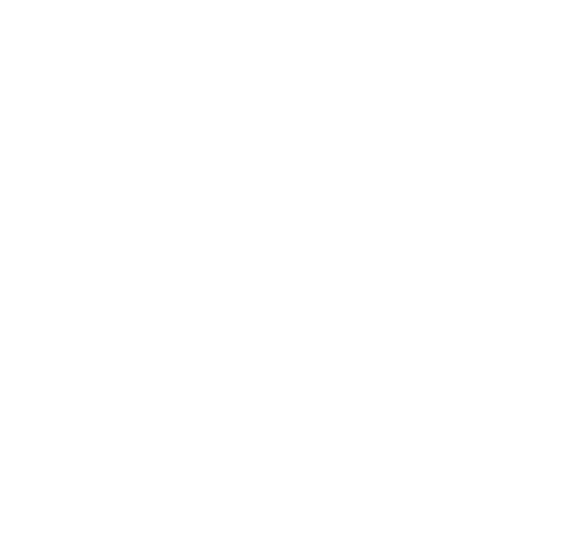

...

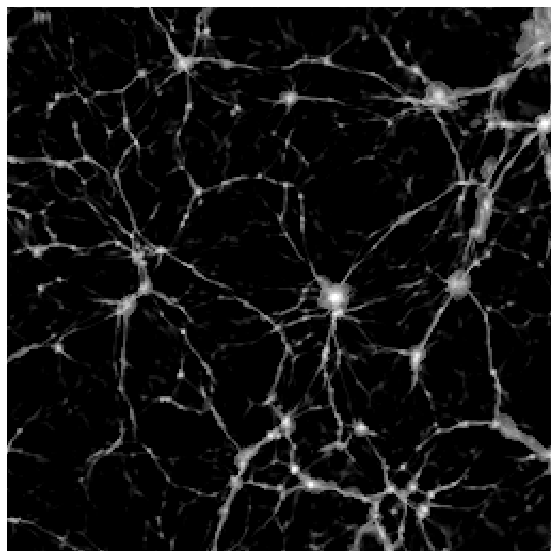

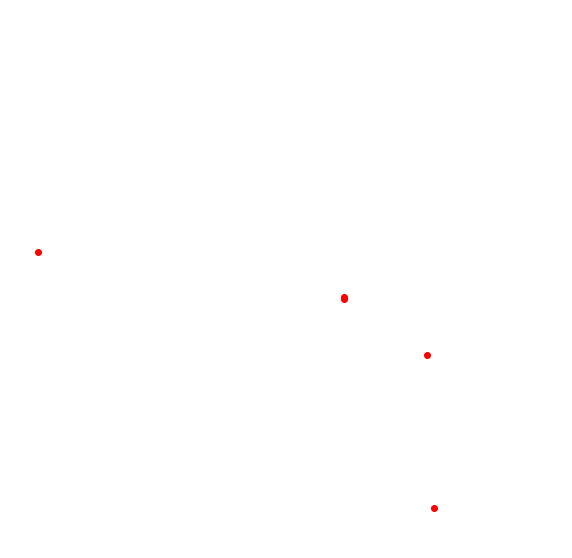

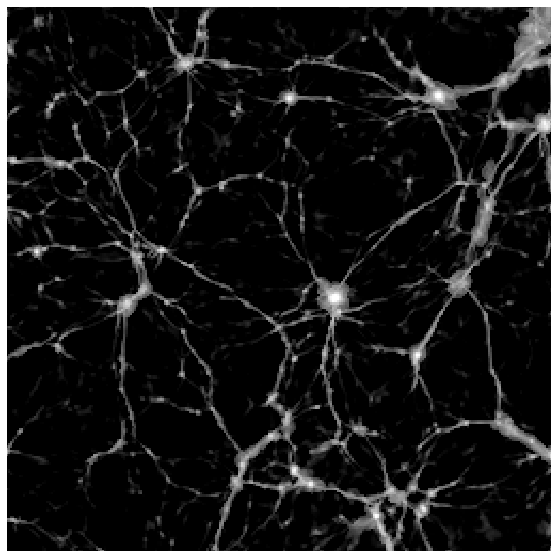

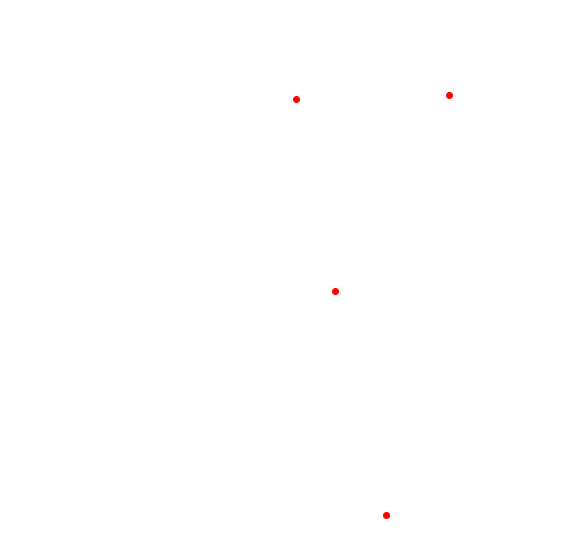

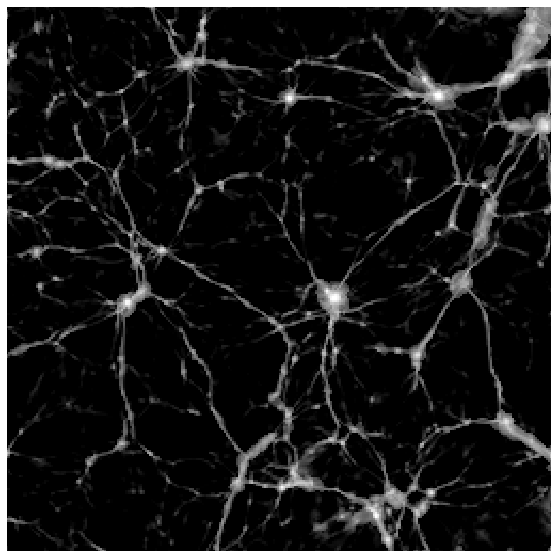

In [92]:
for i in range(256):
        
    plt.figure(figsize=[10,10])
    os.chdir('/storage/cluster/result/coords/')
    try:
        min_coords = np.min(np.where(coords[:,2]==i))
        max_coords = np.max(np.where(coords[:,2]==i))
        plt.scatter(coords[min_coords:max_coords+1,1],coords[min_coords:max_coords+1,0],c='red')
    except:
        pass
    plt.xlim([0,255])
    plt.ylim([0,255])
    plt.axis('off')
    plt.savefig(str(i) + '.png',dpi=34,format='png',bbox_inches='tight',pad_inches=0)
    
    plt.figure(figsize=[10,10])
    os.chdir('/storage/cluster/result/xray_pics/')
    plt.imshow(np.log10(xray_re[:,:,i]),vmin=-14,vmax=-5,cmap='gray')
    plt.xlim([0,255])
    plt.ylim([0,255])
    plt.axis('off')
    plt.savefig(str(i) + '.png',dpi=34,format='png',bbox_inches='tight',pad_inches=0)


    
        #plt.imshow(np.log10(xray_re[:,:,i]),vmin=-14,vmax=-5,cmap='gray')

In [57]:
np.min(np.log10(xray_re[:,:,1]))

-18.299670539754313

In [53]:
print((coords[min_coords:max_coords+1,1],coords[min_coords:max_coords+1,0]))

(array([214, 230, 142, 190]), array([209, 216, 233,   0]))


In [ ]:


### finding local maxima=24/2/2/2

local_box_size = 14
num_candidate = len(candidate_coords)

candidate_x_v2 = []
candidate_y_v2 = []
candidate_z_v2 = []


for nn,(nx,ny,nz) in enumerate(candidate_coords):
    starting_value = xray_re[nx,ny,nz]
    
    for iz in range(local_box_size):
        for iy in range(local_box_size):
            for ix in range(local_box_size):
                
                try:
                    compare_value = xray_re[nx-int(local_box_size/2)+ix+1,ny-int(local_box_size/2)+iy+1,nz-int(local_box_size/2)+iz+1]

                    if starting_value <= compare_value:
                        tmp_x = nx-int(local_box_size/2)+ix+1
                        tmp_y = ny-int(local_box_size/2)+iy+1
                        tmp_z = nz-int(local_box_size/2)+iz+1
                        starting_value = compare_value 
                    else:
                        pass
                except:
                    pass
                
    candidate_x_v2.append(tmp_x)
    candidate_y_v2.append(tmp_y)
    candidate_z_v2.append(tmp_z)
    

test = set(list(zip(candidate_x_v2,candidate_y_v2,candidate_z_v2)))

test = np.array(sorted(test, key = lambda x:x[2]))